# Testing of existing code
The scope of this notebook is to test the existing code, exploring results quality

In [1]:
import dataset
import preprocessing
import os
import numpy as np
from tqdm import tqdm
from PIL import Image
import labels
import pandas as pd
import skimage

C:\Users\line\Desktop\Mauro\2_Preprocessing_Code\amd\prl\dataset.py:8: FutureWarning: The `skimage.morphology.selem` module is deprecated and will be removed in scikit-image 1.0 (`skimage.morphology.selem` has been moved to `skimage.morphology.footprints`).
  from skimage.morphology import selem


In [2]:
path = 'C:\\Users\\line\\Desktop\\Mauro\\0_backup_folder_development\\AMD\\raw_dataset\\amd\\maia\\bcea\\caj_left.png'

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from skimage import exposure
plt.figure(figsize = (20,20))
img = mpimg.imread(path)
array = np.array(img)

import cv2 as cv
def normalize(img,mode = 'Z-score'):
    if mode == 'Z-score':
        normalized_img = dataset.z_score(img)
    elif mode == 'EQ-hist': 
        normalized_img = exposure.equalize_hist(img)

    elif mode == 'CLAHE':
        #TO Implement normalization by zone
        # Adaptive Equalization
        normalized_img = exposure.equalize_adapthist(img, clip_limit=0.03)            
    return normalized_img

normalize(array,'CLAHE')

array([[[0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905],
        ...,
        [0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905]],

       [[0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905],
        ...,
        [0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905]],

       [[0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905],
        ...,
        [0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905]],

       ...,

       [[0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0.02990905, 0.02990905],
        [0.02990905, 0

<Figure size 2000x2000 with 0 Axes>

# LET's SEE THE LABELS FOLDER

[[False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]
 ...
 [False False False ... False False False]
 [False False False ... False False False]
 [False False False ... False False False]]
(1024, 1024)


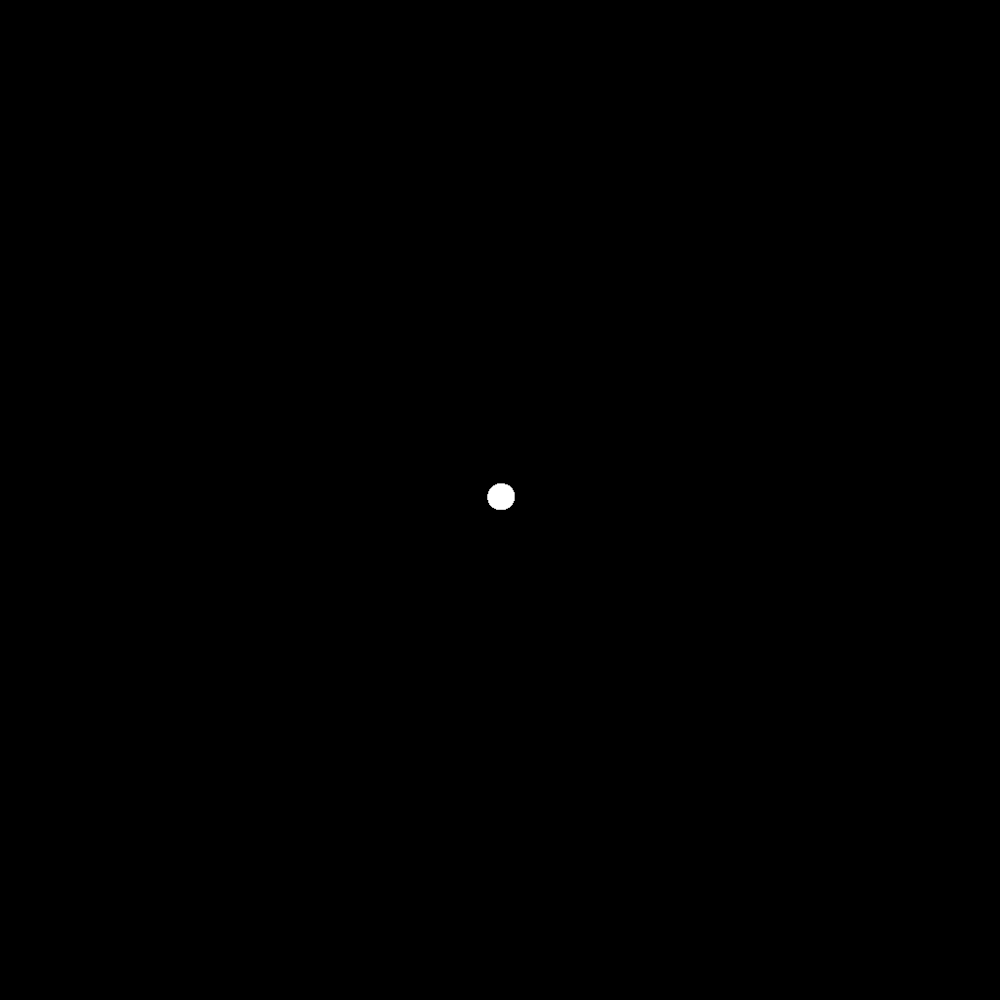

In [4]:
pic = np.load('C:\\Users\\line\\Desktop\\Mauro\\preprocessing\\labels\\control_1_right.npy')
print(pic)
print(pic.shape)
w, h = pic.shape[0],pic.shape[1]
img = Image.fromarray(pic)
img


In [5]:
#root_config = '/chuvdatarc/ja8818/RAD/LINE/Benedetta_Franceschiello/5_OCTs_Jakub_Gwizdala/1_OCT_Dataset/2_Preprocessing_Code/config'
root_config = 'C:\\Users\\line\\Desktop\\Mauro\\2_Preprocessing_Code\\config'
dataset_config = os.path.join(root_config, 'dataset.txt')
output_config = os.path.join(root_config, 'output.txt')
parameters_config = os.path.join(root_config, 'parameters.txt')
_ = dataset.initialize(dataset_config)
eye_identifiers = preprocessing.all_eye_identifiers()
print(labels.maia_bcea_image_path(eye_identifiers[0][0],eye_identifiers[0][1],eye_identifiers[0][2]))

C:\Users\line\Desktop\Mauro\0_backup_folder_development\AMD\raw_dataset\amd\maia\bcea\caj_left.png


In [14]:
path = 'C:\\Users\\line\\Desktop\\Mauro\\0_backup_folder_development\\AMD\\raw_dataset\\amd\\maia\\bcea\\mem_right.jpg'

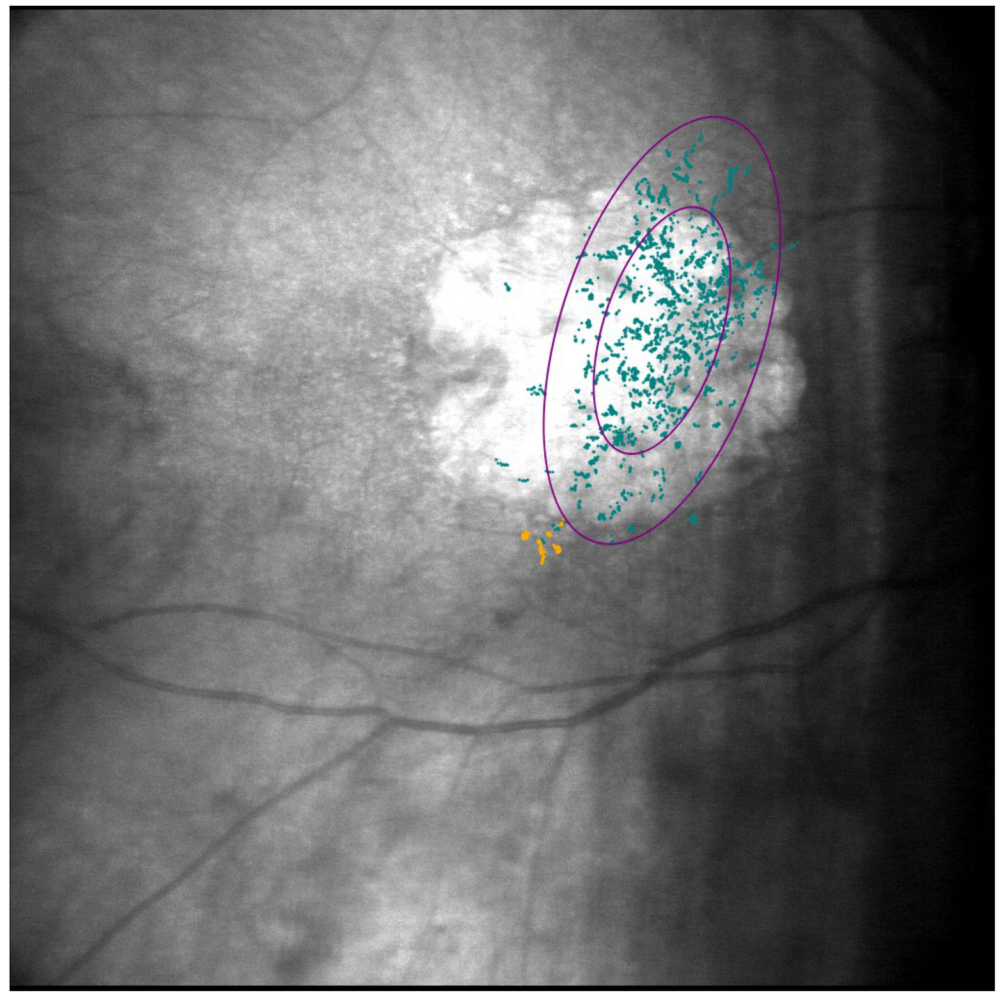

In [16]:
%matplotlib inline
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
plt.figure(figsize = (20,20))
img = mpimg.imread(path)
imgplot = plt.imshow(img)
imgplot.axes.get_xaxis().set_visible(False)
imgplot.axes.get_yaxis().set_visible(False)
plt.show()

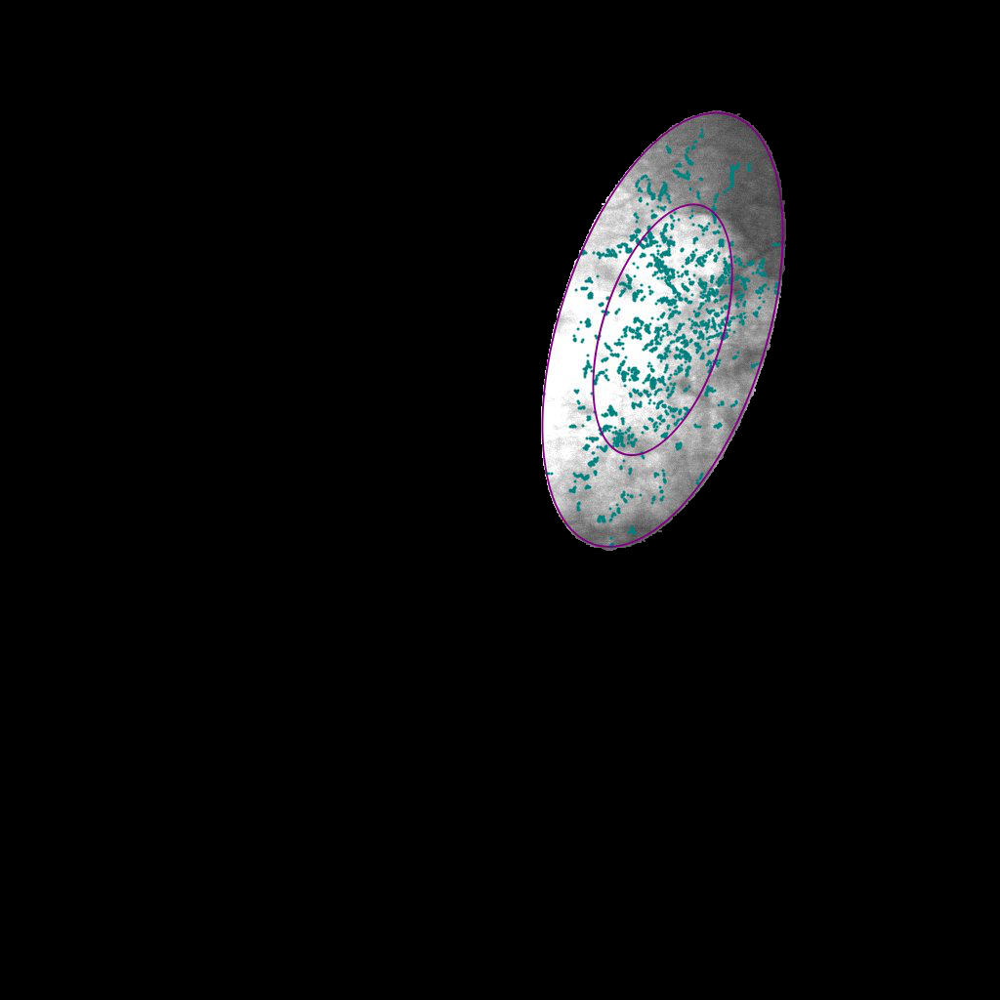

In [17]:
#Let's check correctness of the label by appling the mask to the img
#pic
import imageio
pic = np.load('C:\\Users\\line\\Desktop\\Mauro\\preprocessing\\labels\\amd_4_right.npy')
img = Image.fromarray(pic)
img

im = imageio.imread(path)
for i in range(3):
    im[:,:,i] = np.multiply(im[:,:,i],img)
    
img = Image.fromarray(im)
img
#Everything looks nice =)

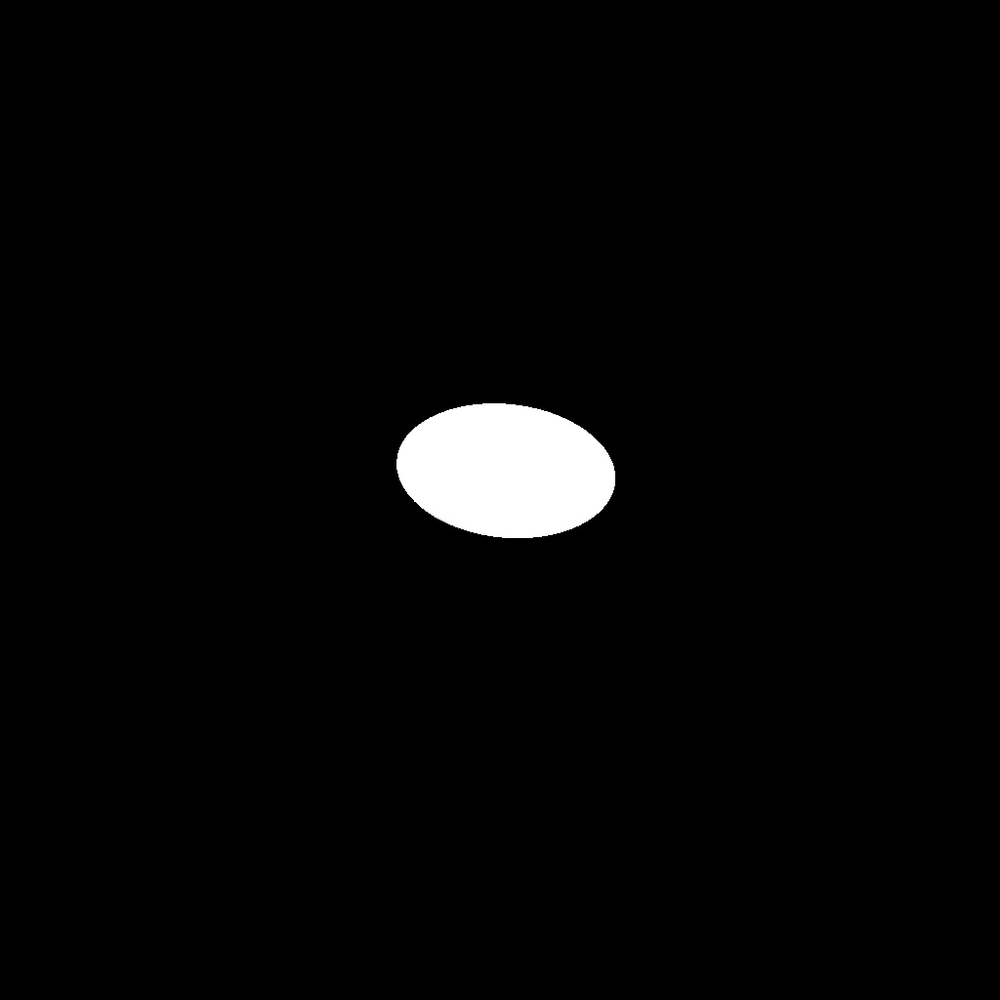

In [68]:
#pic
import imageio
pic = np.load('C:\\Users\\line\\Desktop\\Mauro\\preprocessing\\labels\\amd_3_left.npy')
img = Image.fromarray(pic)
img


# We need to check correctness of the matching strategy, at least for some examples

In [19]:
#We need two fundus imgs and check if the matching works
import registration

In [20]:
maia_fundus =  dataset.image(r'C:\Users\line\Desktop\Mauro\raw_dataset\amd\maia\fundus\caj_left.jpg')
maia_fundus = maia_fundus/255
oct_fundus =  dataset.image(r'C:\Users\line\Desktop\Mauro\raw_dataset\amd\spectralis\fundus\caj_left.tif')

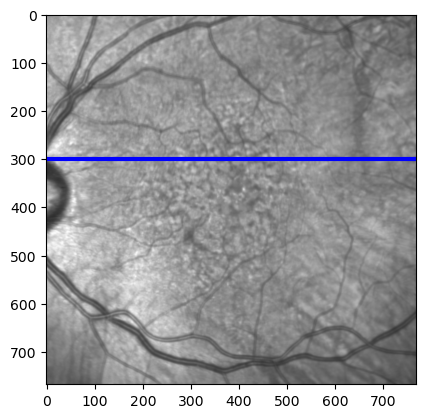

In [21]:
import matplotlib.pyplot as plt
from matplotlib import image

# to read the image stored in the working directory
data = image.imread(r'C:\Users\line\Desktop\Mauro\raw_dataset\amd\spectralis\fundus\caj_left.tif')
  
# to draw a line from (200,300) to (500,100)
x = [0, 800]
y = [300, 300]
plt.plot(x, y, color="blue", linewidth=3)
plt.imshow(data)
plt.show()

(768, 768)
(1024, 1024)
(1024, 1024)


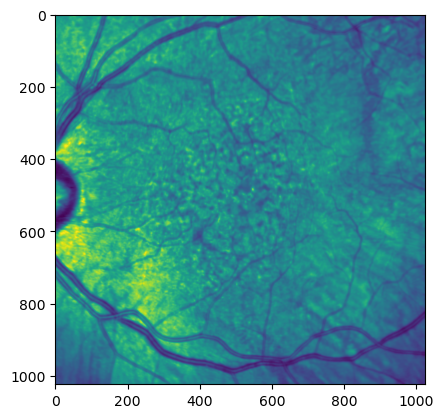

In [22]:
# N_pad = int((maia_fundus.shape[0] - oct_fundus.shape[0])/2)
# new_oct = np.zeros(maia_fundus.shape)
# new_oct[N_pad:oct_fundus.shape[0]+ (N_pad),2*N_pad:oct_fundus.shape[0]+2*N_pad] = oct_fundus
# plt.imshow(new_oct)

print(oct_fundus.shape)
print(maia_fundus.shape)
img = Image.fromarray(oct_fundus)
img = img.resize(size=(1024,1024))
new_oct = np.array(img)
print(new_oct.shape)

plt.imshow(new_oct)

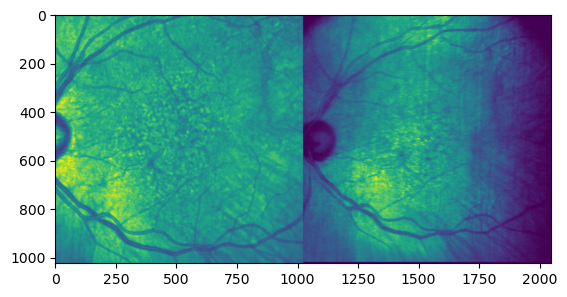

In [23]:
collage = np.hstack((new_oct,maia_fundus))
plt.imshow(collage)

In [24]:
# Find keypoints and match descriptors
oct_keypoints, oct_descriptors = registration.extract_keypoints_and_descriptors(new_oct)
oct_side = oct_fundus.shape[0]
maia_keypoints, maia_descriptors = registration.extract_keypoints_and_descriptors(maia_fundus)
matches = registration.match_descriptors(oct_descriptors, maia_descriptors)

# Filter matches
source_points, destination_points = registration.filter_used_points(oct_keypoints, maia_keypoints, matches)
source_points

array([[  54.661915,  795.51404 ],
       [  61.87134 ,  641.776   ],
       [  69.98875 ,  681.5492  ],
       [  75.257904,  779.5204  ],
       [  92.372955,  634.35345 ],
       [ 119.58918 ,  815.5676  ],
       [ 148.17532 ,  865.11096 ],
       [ 148.62389 ,  844.85864 ],
       [ 164.63135 ,  876.56213 ],
       [ 173.15503 ,  921.6988  ],
       [ 173.9177  ,  959.5913  ],
       [ 178.6663  ,  530.3039  ],
       [ 179.94429 ,  866.438   ],
       [ 184.11829 ,  809.4907  ],
       [ 184.11829 ,  809.4907  ],
       [ 195.01877 ,  966.08044 ],
       [ 198.90778 ,  506.60052 ],
       [ 208.63075 ,  675.3865  ],
       [ 213.27266 ,  952.5939  ],
       [ 215.8695  ,  841.93964 ],
       [ 222.29588 ,  887.8554  ],
       [ 223.13464 ,  780.78394 ],
       [ 225.15202 ,  828.4276  ],
       [ 233.44621 ,  964.624   ],
       [ 236.72502 ,  852.0776  ],
       [ 259.19604 ,  206.86015 ],
       [ 270.76477 ,  867.4681  ],
       [ 274.04495 ,  163.93887 ],
       [ 291.07706 ,

In [25]:
#Geometrical mapping:
# for the new_oct we need that x += 2*N_pad, y += N_pad
# for the maia    we need that x += maia_fundus.shape[0], y += 0
source_points2 = np.array([np.array([xi[0],xi[1]]) for xi in source_points])
destination_points2 = np.array([np.array([xi[0] + maia_fundus.shape[0],xi[1]]) for xi in destination_points])

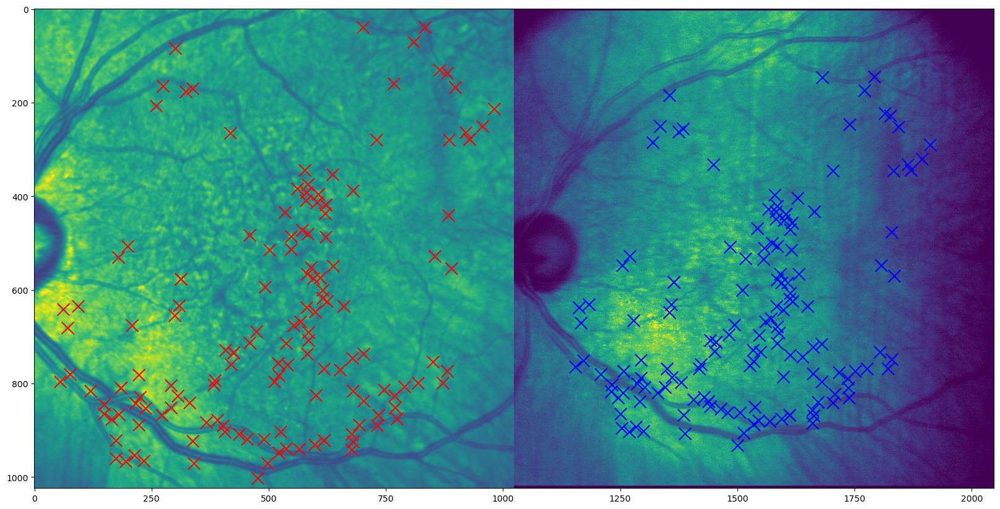

In [45]:
plt.figure(figsize = (20,20))
pts = source_points2
plt.imshow(collage)
plt.scatter(pts[:, 0], pts[:, 1], marker="x", color="red", s=200)
pts = destination_points2
plt.imshow(collage)
plt.scatter(pts[:, 0], pts[:, 1], marker="x", color="blue", s=200)


plt.show()

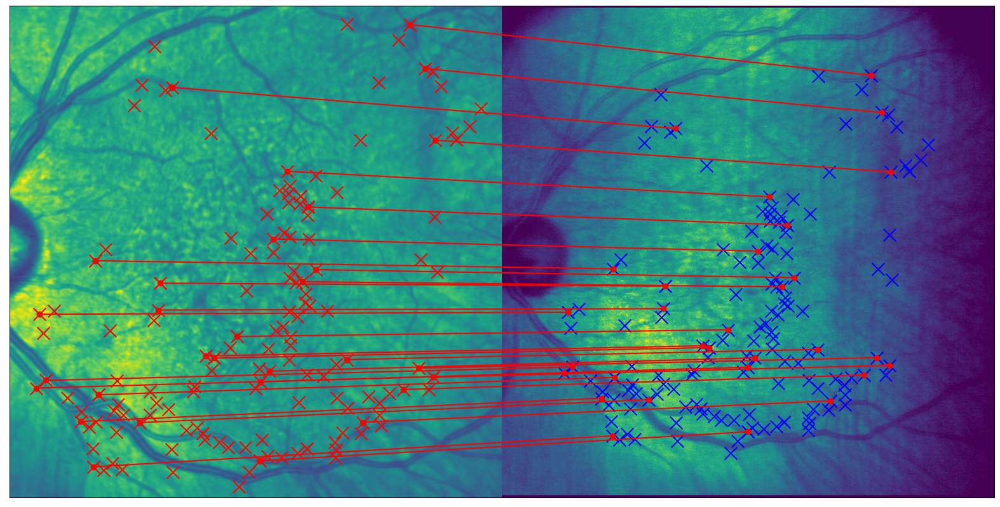

In [62]:
import numpy as np
import matplotlib.pyplot as plt
plt.figure(figsize = (20,20))
plt.imshow(collage)
pts = source_points2
plt.scatter(pts[:, 0], pts[:, 1], marker="x", color="red", s=200)
pts = destination_points2
imgplot = plt.scatter(pts[:, 0], pts[:, 1], marker="x", color="blue", s=200)

imgplot.axes.get_xaxis().set_visible(False)
imgplot.axes.get_yaxis().set_visible(False)

shuffler = np.random.permutation(len(source_points2))
source_points2 = source_points2[shuffler]
destination_points2 = destination_points2[shuffler]

for i in range(30):
    plt.plot([source_points2[i][0],destination_points2[i][0]], [source_points2[i][1],destination_points2[i][1]], 'ro-')

plt.show()

# We also need to check  the pairing step between octs and labels

In [15]:
#Let's select one part identifier as an example and then perform the pairing, the pairing is performed for every identifiers (aka OCT)
root_config = 'C:\\Users\\line\\Desktop\\Mauro\\2_Preprocessing_Code\\config'
dataset_config = os.path.join(root_config, 'dataset.txt')
output_config = os.path.join(root_config, 'output.txt')
parameters_config = os.path.join(root_config, 'parameters.txt')

print('Initializing dataset')
dataset.initialize(dataset_config)

print('Parsing preprocessing config')
output_folders = preprocessing.parse_config_file(output_config)
parameters = preprocessing.parse_config_file(parameters_config)
filename_to_meta_mapping = preprocessing.load_filename_to_meta_mapping(parameters['mapping'])
eye_identifiers = preprocessing.all_eye_identifiers()
part_identifiers = preprocessing.all_part_identifiers()

print('Extracting labels from BCEA images')
preprocessing.create_labels(eye_identifiers, output_folders['labels'], ellipse=parameters['ellipse'])

print('Registering Spectralis and MAIA fundus images')
part_identifiers = preprocessing.compute_coregistration_parameters(
    part_identifiers, output_folders['coregistration'], output_folders['homography']
)

print('Filtering data based on registration SSIM quality')
part_identifiers = preprocessing.filter_identifiers_based_on_coregistration_ssim_measure(
    part_identifiers, output_folders['coregistration'],
    float(parameters['ssim_threshold']), float(parameters['ssim_window_size_fraction'])
)

print('Warping labels')
part_identifiers = preprocessing.create_warped_labels(
    part_identifiers, output_folders['labels'], output_folders['coregistration'],
    output_folders['homography'], output_folders['warped_labels']
)

print('Combining OCT scans with labels')
volume_identifiers = preprocessing.get_volume_identifiers(part_identifiers)
preprocessing.pair_octs_with_labels(
    volume_identifiers, output_folders['warped_labels'],
    output_folders['homography'], output_folders['labelled_octs']
)

#Let's perform pairing for one part
label_images, homography_transforms = {}, {}
identifiers= volume_identifiers
warped_labels_folder = output_folders['warped_labels']
homography_transforms_folder = output_folders['homography']
output_folder = output_folders['labelled_octs']
# select the first ones
identifier = identifiers[0]


Initializing dataset
Parsing preprocessing config
Extracting labels from BCEA images


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [00:04<00:00,  9.79it/s]


Registering Spectralis and MAIA fundus images


100%|████████████████████████████████████████████████████████████████████████████████| 160/160 [01:57<00:00,  1.37it/s]


Filtering data based on registration SSIM quality


100%|████████████████████████████████████████████████████████████████████████████████| 133/133 [01:51<00:00,  1.19it/s]


Warping labels


100%|████████████████████████████████████████████████████████████████████████████████| 125/125 [00:33<00:00,  3.70it/s]


Combining OCT scans with labels


  0%|                                                                                           | 0/39 [00:00<?, ?it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE


  3%|██▏                                                                                | 1/39 [00:00<00:08,  4.37it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE


  5%|████▎                                                                              | 2/39 [00:00<00:10,  3.62it/s]

(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
(496, 512)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 13%|██████████▋                                                                        | 5/39 [00:01<00:07,  4.61it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 15%|████████████▊                                                                      | 6/39 [00:01<00:08,  4.11it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)


 18%|██████████████▉                                                                    | 7/39 [00:01<00:08,  3.99it/s]

(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 76

 21%|█████████████████                                                                  | 8/39 [00:02<00:13,  2.31it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE


 23%|███████████████████▏                                                               | 9/39 [00:02<00:13,  2.27it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 26%|█████████████████████                                                             | 10/39 [00:03<00:10,  2.69it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE


 28%|███████████████████████▏                                                          | 11/39 [00:03<00:08,  3.21it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(7

 31%|█████████████████████████▏                                                        | 12/39 [00:04<00:11,  2.26it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE


 33%|███████████████████████████▎                                                      | 13/39 [00:04<00:12,  2.15it/s]

(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
HERE
(496, 512)
(512,)
(496, 512)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 36%|█████████████████████████████▍                                                    | 14/39 [00:04<00:09,  2.58it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE


 38%|███████████████████████████████▌                                                  | 15/39 [00:05<00:09,  2.46it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 41%|█████████████████████████████████▋                                                | 16/39 [00:05<00:08,  2.81it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 44%|███████████████████████████████████▋                                              | 17/39 [00:05<00:07,  2.99it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 46%|█████████████████████████████████████▊                                            | 18/39 [00:06<00:06,  3.46it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE


 49%|███████████████████████████████████████▉                                          | 19/39 [00:06<00:06,  2.89it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(7

 51%|██████████████████████████████████████████                                        | 20/39 [00:07<00:08,  2.37it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE


 54%|████████████████████████████████████████████▏                                     | 21/39 [00:07<00:06,  2.80it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE


 56%|██████████████████████████████████████████████▎                                   | 22/39 [00:07<00:05,  3.16it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE


 59%|████████████████████████████████████████████████▎                                 | 23/39 [00:08<00:06,  2.59it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE


 62%|██████████████████████████████████████████████████▍                               | 24/39 [00:08<00:06,  2.47it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(7

 64%|████████████████████████████████████████████████████▌                             | 25/39 [00:09<00:06,  2.02it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE


 67%|██████████████████████████████████████████████████████▋                           | 26/39 [00:09<00:05,  2.22it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
An exception occurred
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
An exception occurred
HERE
An exception occurred
HERE
An exception occurred
HERE
An exception occurred
HERE
An exception occurred
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
An exception occurred
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 76

 69%|████████████████████████████████████████████████████████▊                         | 27/39 [00:10<00:08,  1.42it/s]

(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(7

 72%|██████████████████████████████████████████████████████████▊                       | 28/39 [00:11<00:08,  1.32it/s]

(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE


 74%|████████████████████████████████████████████████████████████▉                     | 29/39 [00:11<00:06,  1.65it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE


 77%|███████████████████████████████████████████████████████████████                   | 30/39 [00:12<00:04,  2.06it/s]

(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE


 79%|█████████████████████████████████████████████████████████████████▏                | 31/39 [00:12<00:03,  2.33it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 82%|███████████████████████████████████████████████████████████████████▎              | 32/39 [00:12<00:02,  2.60it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 76

 85%|█████████████████████████████████████████████████████████████████████▍            | 33/39 [00:13<00:03,  1.79it/s]

(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(7

 87%|███████████████████████████████████████████████████████████████████████▍          | 34/39 [00:14<00:03,  1.58it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(7

 90%|█████████████████████████████████████████████████████████████████████████▌        | 35/39 [00:15<00:02,  1.40it/s]

(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 92%|███████████████████████████████████████████████████████████████████████████▋      | 36/39 [00:15<00:01,  1.74it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
An exception occurred
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 95%|█████████████████████████████████████████████████████████████████████████████▊    | 37/39 [00:15<00:00,  2.05it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


 97%|███████████████████████████████████████████████████████████████████████████████▉  | 38/39 [00:16<00:00,  2.45it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:16<00:00,  2.71it/s]

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
(496, 768)
C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs


100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [00:16<00:00,  2.37it/s]


In [16]:
import pairing
for part_identifier in identifier.part_identifiers():
    label_images[part_identifier.part] = preprocessing.load_npy(warped_labels_folder, part_identifier)
    homography_transforms[part_identifier.part] = preprocessing.load_pickle(homography_transforms_folder, part_identifier)

labelled_octs = pairing.pair_octs_with_labels(
    *identifier, identifier.parts, label_images, homography_transforms
    )

HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)
HERE
(496, 768)
(768,)


In [17]:
labelled_octs[0].label.shape

(768,)

In [18]:
labelled_octs[0].image().shape

(496, 768)

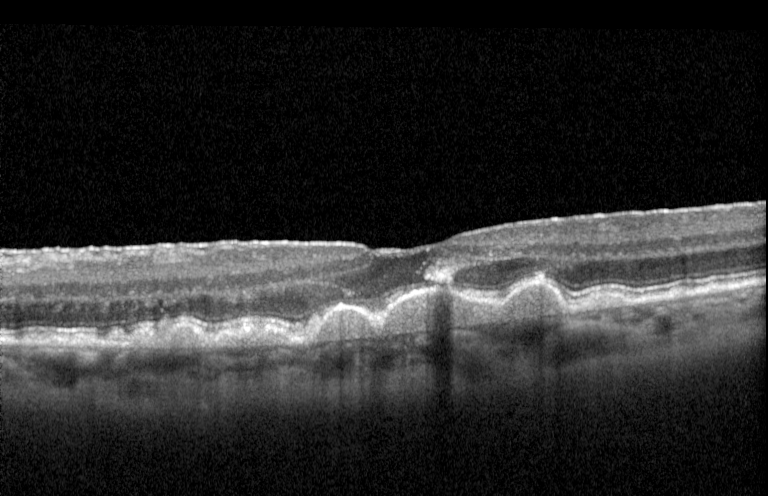

In [19]:
img = Image.fromarray(labelled_octs[0].image())
img

In [20]:
labelled_octs[1].label.shape

(768,)

In [21]:
labelled_octs[1].image().shape

(496, 768)

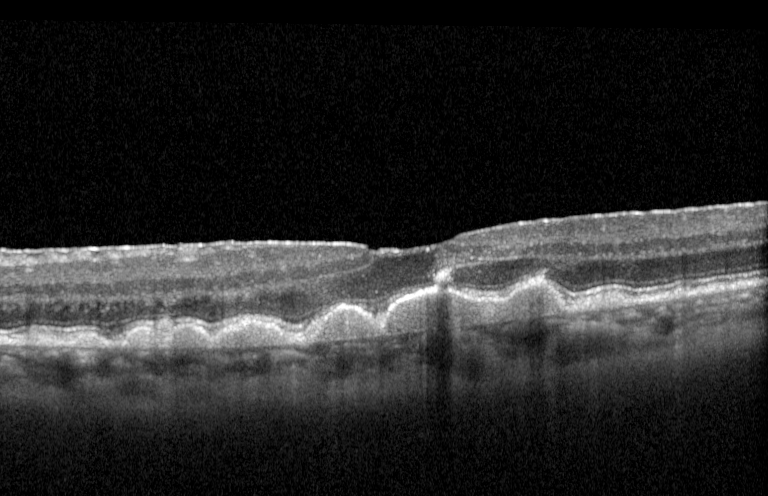

In [22]:
img = Image.fromarray(labelled_octs[1].image())
img

In [23]:
side = int((labelled_octs[1].image().shape[1] - labelled_octs[0].image().shape[1]) / 2)
np.array_equal(labelled_octs[1].image()[:,2*side:labelled_octs[1].image().shape[1]], labelled_octs[0].image())

False

In [26]:
labelled_octs[1].image() == labelled_octs[0].image()

array([[ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       [ True,  True,  True, ...,  True,  True,  True],
       ...,
       [False, False, False, ..., False,  True, False],
       [False, False, False, ..., False,  True, False],
       [ True, False, False, ...,  True,  True, False]])

# LET's SEE THE LABELLED_OCT FOLDER

In [65]:
path = r'C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs\amd_0_left.pickle'


obj = pd.read_pickle(path)

In [5]:
import glob
import os
import pandas as pd

root_path =      r'C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs' 
paths =  glob.glob(os.path.join(root_path + '\*.pickle'))
for path in paths:
    PPocts = pd.read_pickle(path)
    for PPoct in PPocts:
        print(PPoct.image().shape)

(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)

(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)
(496, 768)

In [66]:
obj

[{'group': 'amd', 'subject_id': 0, 'eye': 'left', 'part': 'center', 'oct_scan': {'sequence_number': 26, 'filename': 'C:\\Users\\line\\Desktop\\Mauro\\0_backup_folder_development\\AMD\\raw_dataset\\amd\\spectralis\\oct\\caj_left_center\\1A3CCBC0.tif', 'start': (763, 385), 'end': (763, 1152)}, 'left_limit': 0, 'right_limit': 767},
 {'group': 'amd', 'subject_id': 0, 'eye': 'left', 'part': 'center', 'oct_scan': {'sequence_number': 27, 'filename': 'C:\\Users\\line\\Desktop\\Mauro\\0_backup_folder_development\\AMD\\raw_dataset\\amd\\spectralis\\oct\\caj_left_center\\1A4C0E00.tif', 'start': (758, 385), 'end': (758, 1152)}, 'left_limit': 0, 'right_limit': 767},
 {'group': 'amd', 'subject_id': 0, 'eye': 'left', 'part': 'center', 'oct_scan': {'sequence_number': 28, 'filename': 'C:\\Users\\line\\Desktop\\Mauro\\0_backup_folder_development\\AMD\\raw_dataset\\amd\\spectralis\\oct\\caj_left_center\\1A5CAFD0.tif', 'start': (753, 385), 'end': (753, 1152)}, 'left_limit': 0, 'right_limit': 767},
 {'grou

In [67]:
# FIXATION/ NO FIXATION SEQUENCE ?! SUPER STRANGE THE LABEL LOOK LIKE IS ONLY 010  (1/3,1/3,1/3)
print(obj[0].label)
print(obj[1].label)
print(obj[2].label)
print(obj[0].label.shape)
print(obj[1].label.shape)
print(obj[2].label.shape)

[False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False False False False False
 False False False False False False False False Fa

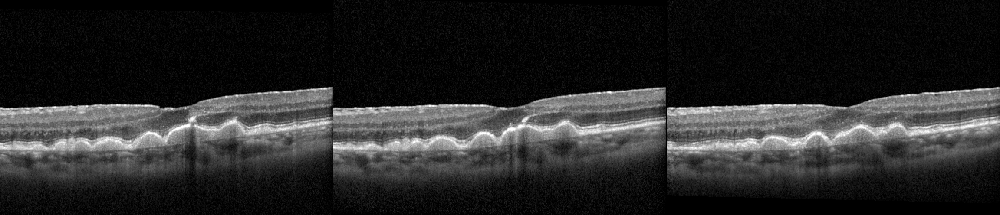

In [68]:
pic1 = obj[1].image()
pic2 = obj[2].image()
pic3 = obj[3].image()
pic = np.hstack((pic1,pic2,pic3))
w, h = pic.shape[0],pic.shape[1]
img = Image.fromarray(pic)
img

In [69]:
pic.shape

(496, 2304)

# LET's SEE THE WARPED_LABELS FOLDER

(1536, 1536)


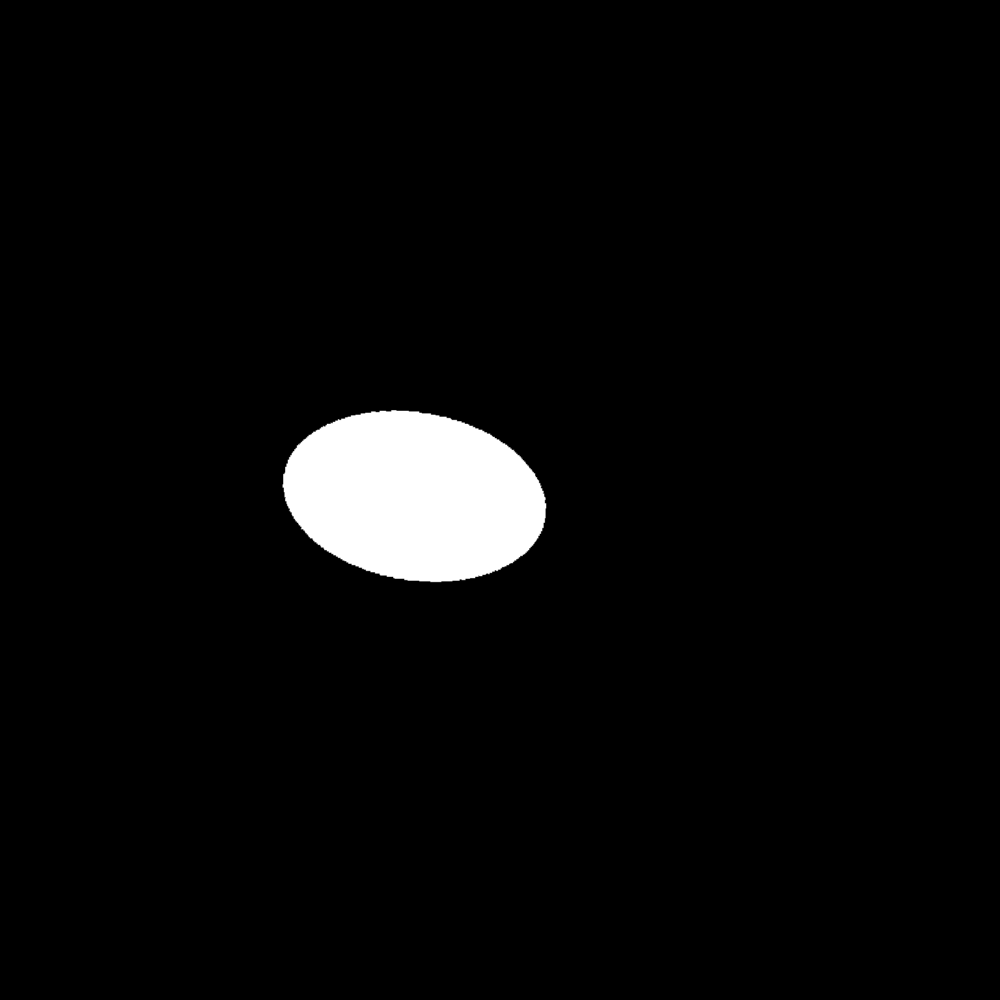

In [67]:
path = r'C:\Users\line\Desktop\Mauro\preprocessing\warped_labels\amd_3_left_center.npy'
pic = np.load(path)
pic = pic==1
print(pic.shape)
w, h = pic.shape[0],pic.shape[1]
img = Image.fromarray(pic)
img

# LET's SEE THE HOMOGRAPHY FOLDER

In [71]:
path =  r'C:\Users\line\Desktop\Mauro\preprocessing\homography\amd_0_left_full.pickle'
obj = pd.read_pickle(path)
obj

<ProjectiveTransform(matrix=
    [[1.16730739e+00, 4.19418615e-02, 6.18046055e+01],
     [3.12562806e-02, 1.19069167e+00, 8.84092913e+01],
     [4.24211452e-05, 7.84623038e-05, 1.00000000e+00]]) at 0x210827fcaf0>

# LET's SEE THE COREGISTRATION FOLDER

In [72]:
path =  r'C:\Users\line\Desktop\Mauro\preprocessing\coregistration\amd_0_left_center.pickle'
obj = pd.read_pickle(path)
obj

{'group': 'amd',
 'subject_id': 0,
 'eye': 'left',
 'part': 'center',
 'oct_descriptors': array([[0.22641721, 0.03672972, 0.        , ..., 0.        , 0.01836486,
         0.06361774],
        [0.21995844, 0.11978181, 0.        , ..., 0.        , 0.        ,
         0.07531493],
        [0.        , 0.        , 0.02564103, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.01790287, 0.0438529 , 0.19855246, ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.05875887, ..., 0.05602439, 0.        ,
         0.        ],
        [0.        , 0.09420153, 0.15936686, ..., 0.        , 0.        ,
         0.        ]], dtype=float32),
 'maia_descriptors': array([[0.03515813, 0.        , 0.        , ..., 0.13616684, 0.11117976,
         0.08369309],
        [0.10034904, 0.19142455, 0.09006602, ..., 0.0236525 , 0.0236525 ,
         0.0236525 ],
        [0.01729804, 0.03459607, 0.03867958, ..., 0.03867958, 0.07338934,
         0.02446312

# LET's SEE THE PREPROCESSED_OCT FOLDER

(496, 768)


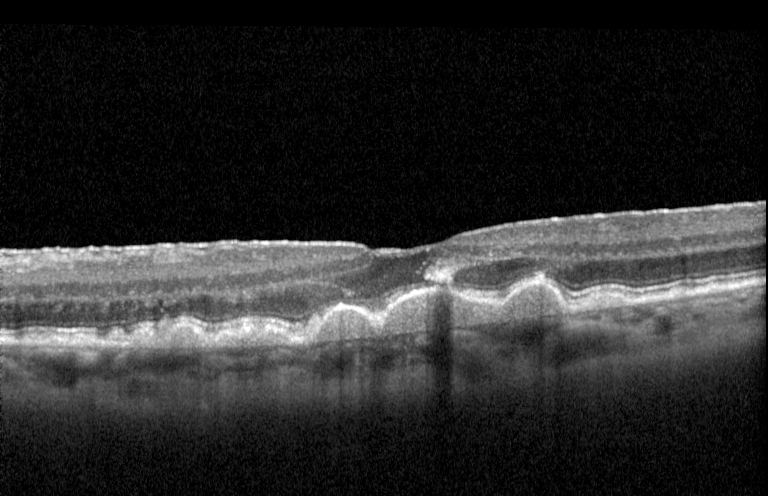

In [80]:
path = r'C:\Users\line\Desktop\Mauro\preprocessing\labelled_octs\amd_0_left.pickle'
scans = pd.read_pickle(path)
obj = scans
rescaler = 255 / obj[0].image().max()
print(obj[0].image().shape)
img = Image.fromarray(obj[0].image()*rescaler).convert('RGB')
img

In [73]:
path = r'C:\Users\line\Desktop\Mauro\preprocessing\preprocessed_octs\amd_0_left.pickle'


scans = pd.read_pickle(path)

In [74]:
scans
print('there are ', len(scans), ' preprocessed OCT scans')
for scan in scans:
    #scan is a preprocessing.PreprocessedOCTScan object
    continue

there are  9  preprocessed OCT scans


In [75]:
obj = scans

In [76]:
rescaler = 255 / obj[0].image().max()

(104, 768)


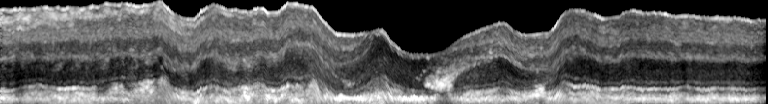

In [77]:
print(obj[0].image().shape)
img = Image.fromarray(obj[0].image()*rescaler).convert('RGB')
img

(104, 768)


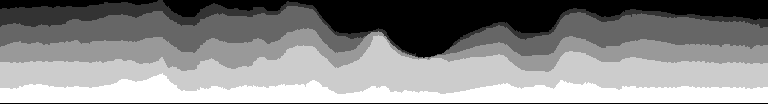

In [78]:
pic = obj[0].labelled_segmentation()
pic
img = Image.fromarray(np.uint8(pic * 51) , 'L')
print(pic.shape)
img
# img = Image.fromarray(pic)
# img

In [8]:
print(obj[0].label().shape)
obj[0].label()

(60,)


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False])

In [9]:
RETINAL_LAYERS = ['INFL', 'ONFL', 'IPL', 'OPL', 'ICL', 'RPE']
for layer in range(len(RETINAL_LAYERS) - 1):
    print(obj[0].thickness(RETINAL_LAYERS[layer],RETINAL_LAYERS[layer+1]))
    print(len(obj[0].thickness(RETINAL_LAYERS[layer],RETINAL_LAYERS[layer+1])))
#Array of thicknesses
thicknesses = np.empty((len(RETINAL_LAYERS)-1,obj[0].image().shape[1]))
for i in range(len(RETINAL_LAYERS) - 1):
    thicknesses[i,:] = obj[0].thickness(RETINAL_LAYERS[i],RETINAL_LAYERS[i+1])

[2 3 3 3 3 3 3 4 4 6 5 5 4 4 3 4 4 4 4 3 3 3 4 4 3 2 2 2 2 2 2 2 2 2 2 2 2
 2 2 2 4 1 1 1 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0]
60
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 1 1 1 1 1 1 1 0 0 0 0
 0 0 0 0 0 0 0 1 1 1 0 0 0 0 0 0 2 1 0 1 1 1 0]
60
[4 4 4 4 4 4 4 3 3 2 3 3 3 3 4 4 4 4 4 4 4 4 4 4 4 4 4 3 3 3 3 3 2 3 3 3 3
 3 3 3 2 2 2 2 1 1 1 2 1 1 2 2 3 1 2 2 1 1 1 2]
60
[50 52 52 52 52 51 50 50 49 48 47 47 46 45 45 45 44 43 42 41 40 39 39 38
 38 37 37 36 35 34 33 33 34 34 33 33 33 33 32 32 33 33 33 33 33 32 32 32
 33 32 32 32 31 32 32 33 34 34 34 34]
60
[17 15 15 16 15 16 17 17 17 17 17 16 15 15 13 11 11 11 11 12 12 12 11 11
 11 11 10 11 12 13 13 13 12 12 12 12 12 11 12 12 11 11 11 10 11 12 12 12
 11 12 12 12 12 11 11 11 11 11 11 11]
60


In [12]:
print(obj[0].thicknesses().shape)
print(thicknesses)
print(thicknesses == obj[0].thicknesses())

(5, 60)
[[ 2.  3.  3.  3.  3.  3.  3.  4.  4.  6.  5.  5.  4.  4.  3.  4.  4.  4.
   4.  3.  3.  3.  4.  4.  3.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.  2.
   2.  2.  2.  2.  4.  1.  1.  1.  0.  0.  0.  0.  0.  1.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.]
 [ 0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  1.  1.  1.  1.  1.  1.  1.  1.  0.  0.  0.
   0.  0.  0.  0.  0.  0.  0.  0.  1.  1.  1.  0.  0.  0.  0.  0.  0.  2.
   1.  0.  1.  1.  1.  0.]
 [ 4.  4.  4.  4.  4.  4.  4.  3.  3.  2.  3.  3.  3.  3.  4.  4.  4.  4.
   4.  4.  4.  4.  4.  4.  4.  4.  4.  3.  3.  3.  3.  3.  2.  3.  3.  3.
   3.  3.  3.  3.  2.  2.  2.  2.  1.  1.  1.  2.  1.  1.  2.  2.  3.  1.
   2.  2.  1.  1.  1.  2.]
 [50. 52. 52. 52. 52. 51. 50. 50. 49. 48. 47. 47. 46. 45. 45. 45. 44. 43.
  42. 41. 40. 39. 39. 38. 38. 37. 37. 36. 35. 34. 33. 33. 34. 34. 33. 33.
  33. 33. 32. 32. 33. 33. 33. 33. 33. 32. 32. 32. 33. 32. 32. 32. 31. 32.
  32. 33. 34. 34. 34. 3

In [ ]:
pic = obj[0]._segmentation
img = Image.fromarray(np.uint8(pic * 51) , 'L')
print(pic.shape)
img

In [7]:
pic.shape

(104, 768)

In [8]:
## NEED TO CHECK FOR THIS LABELS, THEY SEEM TRIVIAL a x 0 , b x 1, a x 0 AND WHAT IS THIS SHAPE?!?!
label = obj[0].label()
print(label.shape)
print(label)

(60,)
[0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 1. 1. 1. 1. 1. 1. 1. 1. 1.
 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 1. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]


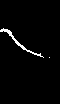

In [9]:
pic = obj[0].segmentation(inner_layer='INFL', outer_layer='ONFL')
img = Image.fromarray(pic)
img

In [10]:
pic = obj[0].thickness(inner_layer='INFL', outer_layer='ONFL')
pic

array([2, 3, 3, 3, 3, 3, 3, 4, 4, 6, 5, 5, 4, 4, 3, 4, 4, 4, 4, 3, 3, 3,
       4, 4, 3, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 4, 1, 1, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])

In [14]:
import preprocessing
## STILL TO IMPLEMENT?!?
stripes = obj[0].to_stripe_samples(stripe_width_in_degrees_of_visual_angle = 0.5)
print(stripes[0].image())
print(stripes[0].labelled_segmentation())
print(stripes[0].thickness(inner_layer='INFL', outer_layer='ONFL'))
print(stripes[0].label())

2
[[-0.76103689 -0.74314691 -0.76103689 ... -0.671587   -0.36745737
  -0.63580704]
 [-0.68947698 -0.60002709 -0.76103689 ... -0.54635715 -0.49268722
  -0.58213711]
 [-0.76103689 -0.76103689 -0.76103689 ... -0.63580704 -0.74314691
  -0.76103689]
 ...
 [ 2.88851864  2.8348487   2.70961886 ...  2.72750884  2.94218857
   2.79906875]
 [ 3.01374849  2.85273868  2.74539881 ...  2.62016897  2.6738389
   2.49493912]
 [ 3.0853084   2.81695873  2.90640862 ...  2.56649903  2.53071908
   2.44126919]]
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [5. 5. 5. ... 5. 5. 5.]
 [5. 5. 5. ... 5. 5. 5.]
 [0. 0. 0. ... 0. 0. 0.]]
[2 3 3 3 3 3 3 4 4 6 5 5 4 4 3 4 4 4 4 3 3 3 4 4 3]
0


In [31]:
stripes

In [22]:
np.unique(stripes[0].labelled_segmentation(), return_counts=True)


(array([0., 1., 3., 4., 5.]),
 array([ 921,   91,   92, 1145,  351], dtype=int64))

In [30]:
pic = obj[0].image()
print(pic.shape)
print(stripes[0].image().shape)
print(np.all(pic[:,:25] == stripes[0].image()))

(104, 60)
(104, 25)
True


In [19]:
img = stripes[0].labelled_segmentation()
print(img.shape)
img = Image.fromarray(pic)
img

(104, 25)


In [20]:
im = stripes[0].labelled_segmentation()
Image.fromarray(im).show()

In [17]:
img = stripes[0].image()
print(img.shape)
img = Image.fromarray(pic)
img

(104, 25)


In [ ]:
import matplotlib.pyplot as plt
path = r'C:\Users\line\Desktop\Mauro\raw_dataset\control\spectralis\oct\bas_right_up/1F32A930.tif'
image = skimage.io.imread(fname = path)
plt.imshow(image)

In [ ]:
import segmentation
segmentation.parse_meta_file(
                    path,
                    segmentation.RETINAL_LAYERS
                )

In [ ]:
path = r'C:\Users\line\Desktop\Mauro\2_Preprocessing_Code\amd\prl\filename_to_meta_mapping_extended_and_restored.pickle'

obj = pd.read_pickle(path)
obj

In [ ]:
my_dictionary = {(str(k).replace('/', '\\')).replace('\\\\', '\\'): v[0].replace("/", "\\").replace('\\\\', '\\')
                 .replace('\\\\', '\\') for k, v in obj.items()}
print(my_dictionary)